# CMU Portugal - Project 3 - Wine Quality <h3>December 2024</h3>

# Problem Statement

The goal of this analysis is to determine the quality of wine given a set of physicochemical input variables.

# Dataset - Wine Quality

The dataset is related to white variants of the Portuguese "Vinho Verde" wine. For more details, consult: http://www.vinhoverde.pt/en/ or the reference [Cortez et al., 2009].  These datasets can be viewed as classification or regression tasks.  

Per the authors of the dataset:  "The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Outlier detection algorithms could be used to detect the few excellent or poor wines. Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods."

<table>
    <tr>
        <td>Dataset Characteristics: Multivariate</td>
        <td>Subject Area: Business </td>
    </tr>
    <tr>
        <td>Associated Tasks: Classification, Regression</td>
        <td>Feature Type: Real</td>
    </tr>
    <tr>
        <td>Instance Count: 4898</td>
        <td>Feature Count: 11</td>
    </tr>
</table>

Input variables (based on physicochemical tests):
   1 - fixed acidity
   2 - volatile acidity
   3 - citric acid
   4 - residual sugar
   5 - chlorides
   6 - free sulfur dioxide
   7 - total sulfur dioxide
   8 - density
   9 - pH
   10 - sulphates
   11 - alcohol

Output variable (based on sensory data): 
   12 - quality (score between 0 and 10)

(<a href = "https://archive.ics.uci.edu/dataset/186/wine+quality">Link to data source</a>)

In [1]:
import pandas as pd
import numpy as np
import os
import requests
import zipfile
import io

import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import colors as mcolors

from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve  

In [2]:
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, VotingClassifier

In [3]:
! pip install xgboost

In [4]:
import xgboost as xgb

# Load and Preview Data

In [5]:
dataset_path = "dataset/winequality-white.csv"
df = pd.read_csv(dataset_path, delimiter=';')

df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4898 entries, 0 to 4897
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         4898 non-null   float64
 1   volatile acidity      4898 non-null   float64
 2   citric acid           4898 non-null   float64
 3   residual sugar        4898 non-null   float64
 4   chlorides             4898 non-null   float64
 5   free sulfur dioxide   4898 non-null   float64
 6   total sulfur dioxide  4898 non-null   float64
 7   density               4898 non-null   float64
 8   pH                    4898 non-null   float64
 9   sulphates             4898 non-null   float64
 10  alcohol               4898 non-null   float64
 11  quality               4898 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 459.3 KB


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


# Exploratory Data Analysis

In [6]:
from ydata_profiling import ProfileReport

# Generate a profile report
profile = ProfileReport(df, title="Data Profile Report", explorative=True)

# To display the report inline in a Jupyter Notebook (if using one)
profile.to_notebook_iframe()

# To display in HTML file (Does not remove post yprofiling bug)
# profile.to_file("data_profile_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Analysis of profile:
- Null Values:  There are no null values that need to be addressed (also confirmable by running df.info())
- Coorelation 


<h3> Fix ydata profile issue

In [9]:
# Note1a: After using ydata profiling, the the matplotlib functions dont work (error msg:figurecanvasagg is non-interactive)
# Note1b: installing PyQt5==5.15.10, as shown below, resolves this issue

# Note2:Using "%matplotlib inline" before the matplotlib functions is also quick fix, but it results in duplicated charts

! pip install PyQt5==5.15.10

<h3> Look for Outliers

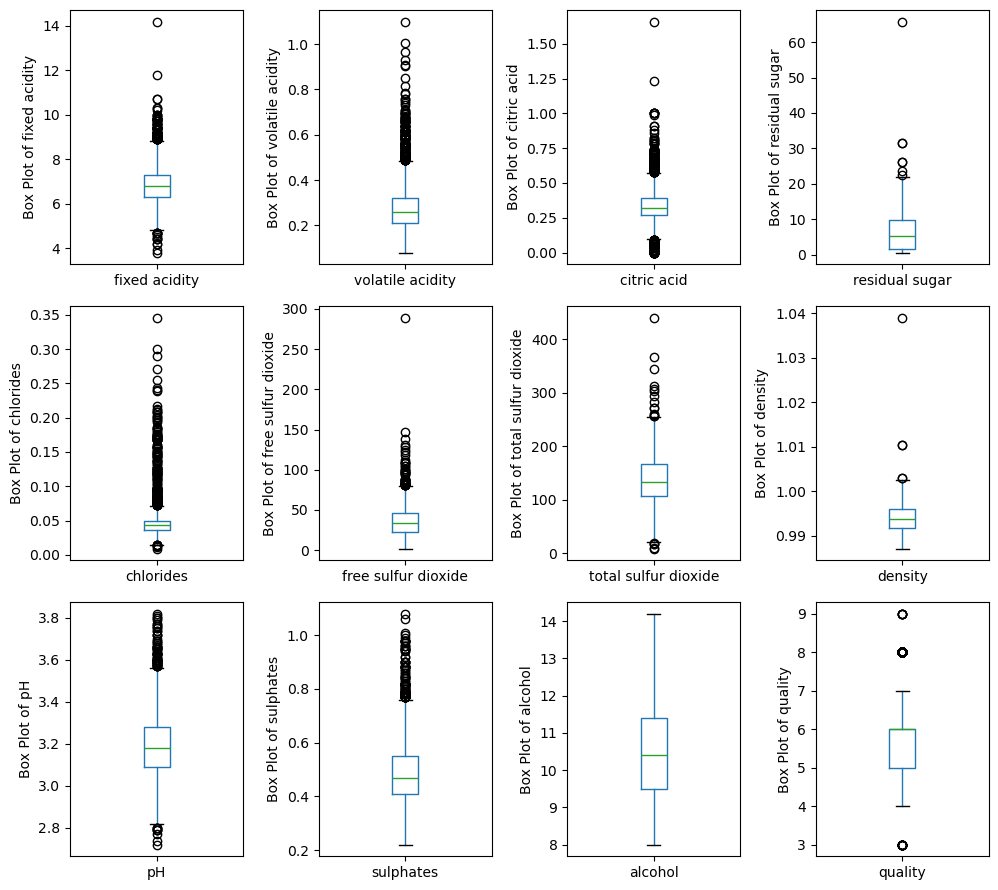

In [15]:
# Box plot to graphically show outlier analysis
%matplotlib inline
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 9))

for x in range(len(df.columns.values)):
    plt.subplot(3,4,x+1) #attempting to print output in grid
    df.boxplot(column=df.columns.values[x], grid=False)
    plt.ylabel("Box Plot of " + df.columns.values[x])
    
plt.tight_layout()
plt.show()    

Analysis of Box Plots:
- Residual sugar, Free sulfur dioxide, and density have the most noticable outliers

Next Steps:
- Remove outliers using appropriate method depending on normality of the data.  Use distrubutions below to determine normality

<h3> Function defintions (test normality and removing outliers)

In [11]:
# Function to test if column is normally distributed
def is_normal(df, column_name):
    skewness = df[column_name].skew()
    kurtosis = df[column_name].kurt()

    print(f"Skewness: {skewness}")
    print(f"Kurtosis: {kurtosis}")

    if abs(skewness) < 0.5 and abs(kurtosis - 3) < 1:
        print(f"The '{column_name}' column is approximately normally distributed.")
    else:
        print(f"The '{column_name}' column is not normally distributed.")
    
# Function to remove outliers using IQR method
def remove_outliers_using_iqr(df, column_name):
    # Calculate the IQR
    Q1 = df[column_name].quantile(0.25)  # First quartile
    Q3 = df[column_name].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1

    # Define outlier bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out outliers
    df = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]
    
    return df
    

<h3> Test for normality

In [12]:
is_normal(df, 'residual sugar')
is_normal(df, 'free sulfur dioxide')
is_normal(df, 'density')

Skewness: 1.0770937564240868
Kurtosis: 3.4698201025634265
The 'residual sugar' column is not normally distributed.
Skewness: 1.4067449205303078
Kurtosis: 11.466342426607905
The 'free sulfur dioxide' column is not normally distributed.
Skewness: 0.9777730048689898
Kurtosis: 9.793806910765252
The 'density' column is not normally distributed.


<h3> Remove outliers

In [14]:
# Remove outliers for residual sugar, free sulfur dioxide and density
# Use the IQR method, since none of the distributions are normal

remove_outliers_using_iqr(df, 'residual sugar')
remove_outliers_using_iqr(df, 'free sulfur dioxide')
remove_outliers_using_iqr(df, 'density')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6
...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7


In [ ]:
# Remove outliers for residual sugar using IQR method, since distribution (shown below) is clearly not normal

# Calculate the IQR
Q1 = df['residual sugar'].quantile(0.25)  # First quartile
Q3 = df['residual sugar'].quantile(0.75)  # Third quartile
IQR = Q3 - Q1

# Define outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out outliers
df = df[(df['residual sugar'] >= lower_bound) & (df['residual sugar'] <= upper_bound)]

# Evaluate Distributions

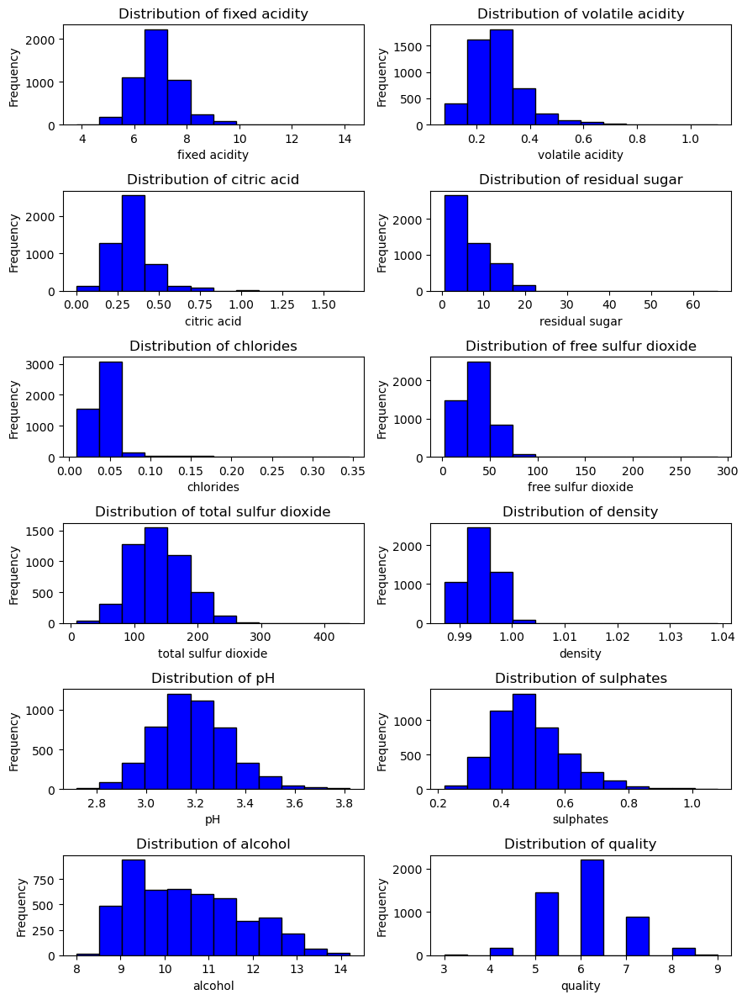

In [16]:
# Graph and evaluate histograms

plt.figure(figsize=(9, 12))

for x in range(len(df.columns.values)):
    #plt.figure(figsize=(4, 2))
    plt.subplot(6,2,x+1) #attempting to print output in grid
    df[df.columns.values[x]].plot(kind='hist', bins=12, color='blue', edgecolor='black')
    plt.title("Distribution of "+ df.columns.values[x])
    plt.xlabel(df.columns.values[x])
    plt.ylabel("Frequency")
    
plt.tight_layout()
plt.show()        


Analysis of histograms:
- A number of input variables are skewed, which may violate the assumptions of normality that underlie linear regression.  Because of this we should apply transformations to the skewed variables to improve regression results

- Our attributes have very different scales (e.g. 0.2-1.0 vs 0-400).  Because of this, we will want to do feature scaling to increase model accuracy and improve speed of convergence for optimization algorithms like gradient descent.

- The "Distribution of quality" histogram clearly shows that the classes are not balanced (i.e. there are not the same number of high quality wines as there are low qualtiy wines in the dataset).  Therefore, we must use "stratify = y" when we do the train/test split.

# Descriptive Statistics

                      fixed acidity  volatile acidity  citric acid  \
fixed acidity              1.000000         -0.026832     0.289996   
volatile acidity          -0.026832          1.000000    -0.155396   
citric acid                0.289996         -0.155396     1.000000   
residual sugar             0.084037          0.045408     0.089521   
chlorides                  0.022866          0.068880     0.112709   
free sulfur dioxide       -0.042525         -0.098717     0.122471   
total sulfur dioxide       0.094575          0.089224     0.128616   
density                    0.267469          0.001485     0.147605   
pH                        -0.425700         -0.032251    -0.164719   
sulphates                 -0.011380         -0.033725     0.059532   
alcohol                   -0.121488          0.069276    -0.078552   
quality                   -0.112119         -0.194063    -0.012609   

                      residual sugar  chlorides  free sulfur dioxide  \
fixed acidity    

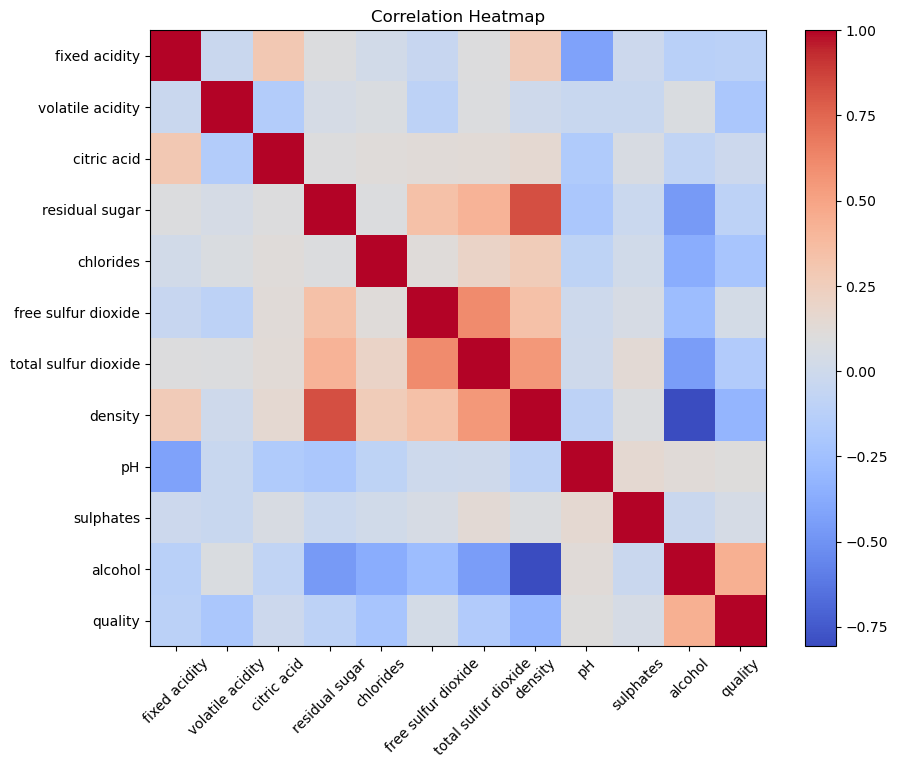

In [9]:
# Calculate coorelation between numeric variables 

plt.figure(figsize=(10, 8))
correlation = df.corr(numeric_only=True)
print(correlation)

plt.imshow(correlation, cmap='coolwarm')
plt.colorbar()
plt.xticks(range(len(correlation)), correlation.columns, rotation=45)
plt.yticks(range(len(correlation)), correlation.columns)
plt.title("Correlation Heatmap")
plt.show()

Analysis of correlation heatmap:
- Total Sulfur Dioxide and Free Sulfur dioxide are correlated (0.62)
- Density and residual sugar are highly positively coorelated (0.84)
- Density and Total sulfur dioxide are coorelated (0.53)
- pH and Fixed acidity are negatively coorelated (-0.43)
- Alcohol and residual sugar are negatively coorelated (-0.45)
- Alcohol and total sulfur dioxide are negatively coorelated (-0.45)
- Alcohol and density are highly negatively coorelated (-0.78)

Next steps: 
- Consider priciple component analysis to determine which variables to keep
- 1st review pair plot to confirm

<Figure size 1200x1200 with 0 Axes>

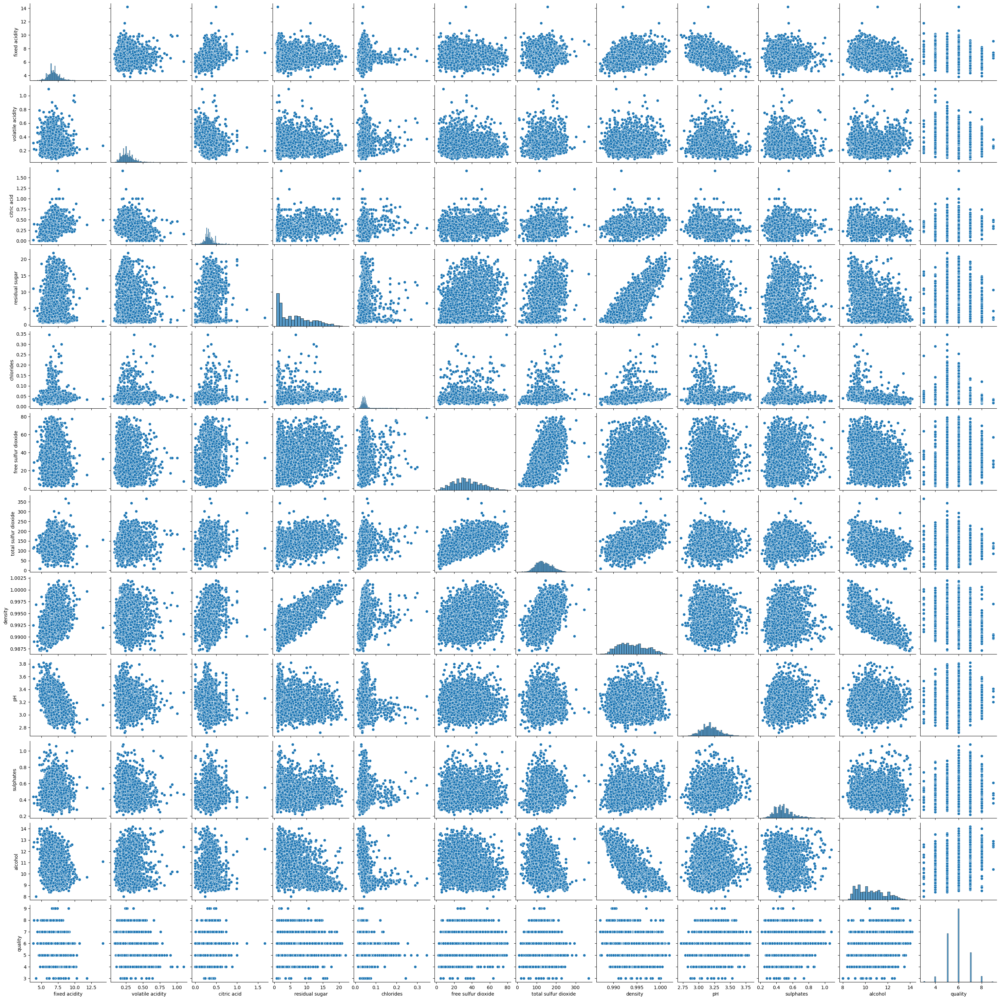

In [10]:
# Create pairplot to visualize relationship between all variables 

plt.figure(figsize=(12, 12))
sns.pairplot(df)

Analysis of PairPlot:
- Visual inspection of pairplot confirms results of correlation heatmap analysis

Next:
- Use PCA to determine features to keep

# Principle Component Analysis

Explained Variance Ratio per Component: [0.29868544 0.14190521 0.11007616 0.09330331 0.08821845 0.0842649
 0.06394711 0.05457934 0.03690592]
Number of components selected: 9


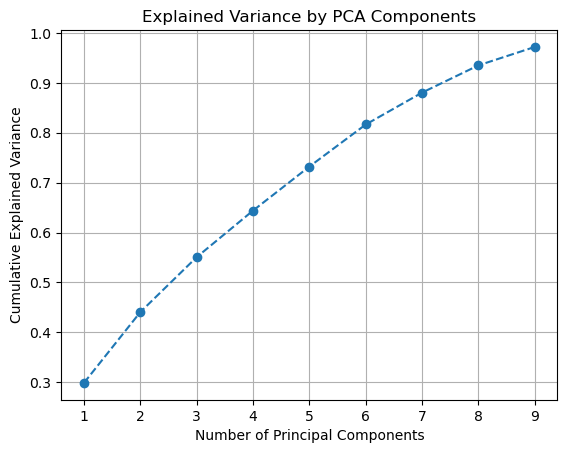

        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0  3.788087  0.465958  0.921249 -1.249909 -0.094917 -0.859532  0.260627   
1 -0.680451 -0.465668  0.321403  0.925584 -0.783055 -0.574451  0.629567   
2  0.165389  1.159179  0.019877  0.203507 -0.384209 -0.502671  0.720570   
3  1.533331 -0.112154  0.024209 -0.459499 -0.441594  0.754999 -0.297424   
4  1.533331 -0.112154  0.024209 -0.459499 -0.441594  0.754999 -0.297424   

        PC8       PC9  
0 -1.068015  0.228645  
1  0.517735 -1.063947  
2  0.886897  0.610206  
3  0.659568  0.261926  
4  0.659568  0.261926  


In [26]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

#Step 0: Make dataframe with only the input variables.  PCA should only be performed on the inputs vars
input_df = df.iloc[:, :-1] 

# Step 1: Standardize the features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(input_df)

# Step 2: Apply PCA
pca = PCA(n_components=0.95)  # Retain components that explain 95% of the variance
reduced_data = pca.fit_transform(scaled_data)

# Step 3: Create a DataFrame for the reduced data
reduced_df = pd.DataFrame(reduced_data, columns=[f'PC{i+1}' for i in range(reduced_data.shape[1])])

# Step 4: Explained Variance Ratio
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratio per Component:", explained_variance)
print(f"Number of components selected: {pca.n_components_}")

# Step 5: Visualize cumulative explained variance
plt.plot(range(1, len(explained_variance)+1), explained_variance.cumsum(), marker='o', linestyle='--')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by PCA Components')
plt.grid()
plt.show()

# Step 6: Display reduced data
print(reduced_df.head())


PCA reduced the number of inputs from 11 to 9
We lose visibility into the specific column names/info becuase PCA actually results in 9 new features ( PCA1, PCA2, etc)

              PC1           PC2           PC3           PC4           PC5  \
PC1  1.000000e+00 -4.642978e-16  1.018278e-16 -3.471936e-17 -1.739573e-16   
PC2 -4.642978e-16  1.000000e+00  7.097587e-17 -1.851266e-16 -1.429266e-16   
PC3  1.018278e-16  7.097587e-17  1.000000e+00  1.765121e-17 -1.746466e-16   
PC4 -3.471936e-17 -1.851266e-16  1.765121e-17  1.000000e+00  1.475100e-16   
PC5 -1.739573e-16 -1.429266e-16 -1.746466e-16  1.475100e-16  1.000000e+00   
PC6 -1.841680e-16  8.586857e-17  1.335124e-17 -8.288381e-17 -2.193484e-16   
PC7  3.282645e-17 -4.460570e-16 -5.100077e-16 -1.767929e-16 -1.399016e-16   
PC8 -1.920910e-16  1.302139e-16 -1.535890e-16 -2.977652e-17 -2.624718e-17   
PC9 -7.760362e-17  3.468012e-16 -3.551548e-17  2.051458e-16 -5.641962e-16   

              PC6           PC7           PC8           PC9  
PC1 -1.841680e-16  3.282645e-17 -1.920910e-16 -7.760362e-17  
PC2  8.586857e-17 -4.460570e-16  1.302139e-16  3.468012e-16  
PC3  1.335124e-17 -5.100077e-16 -1.535890e-

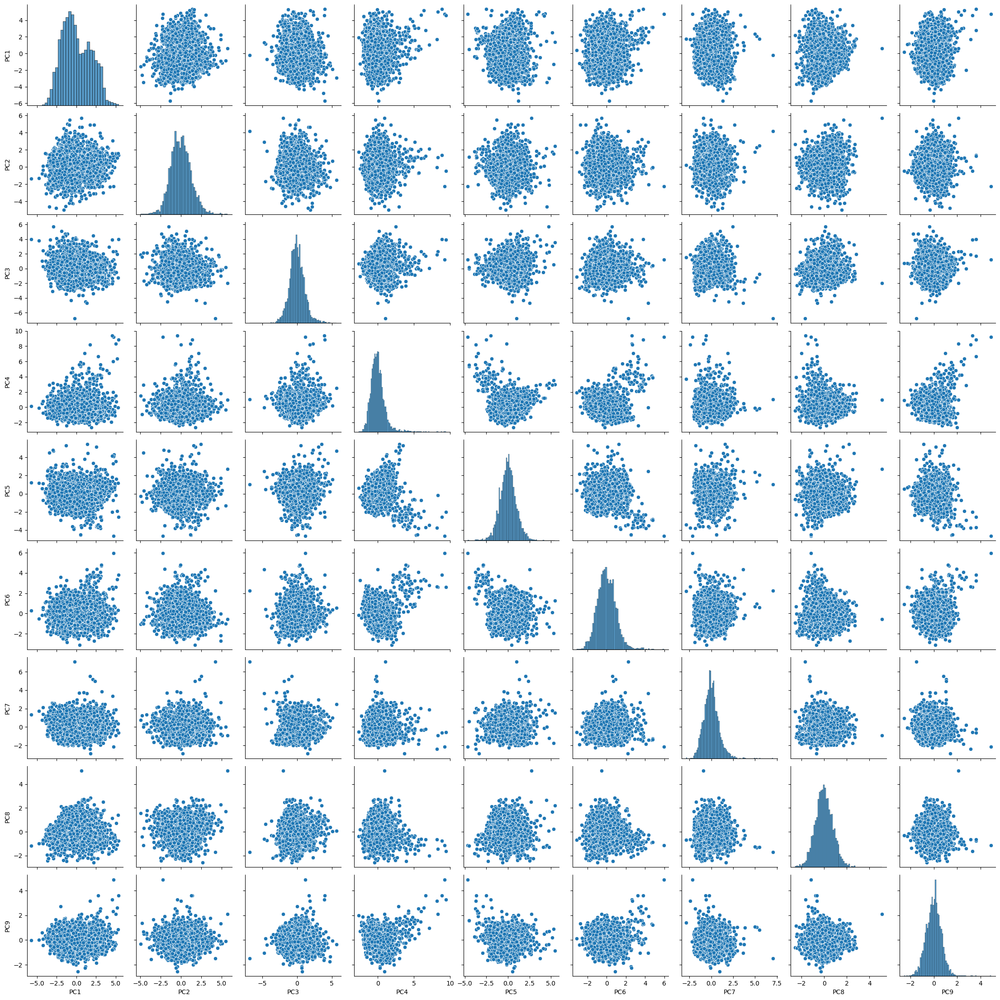

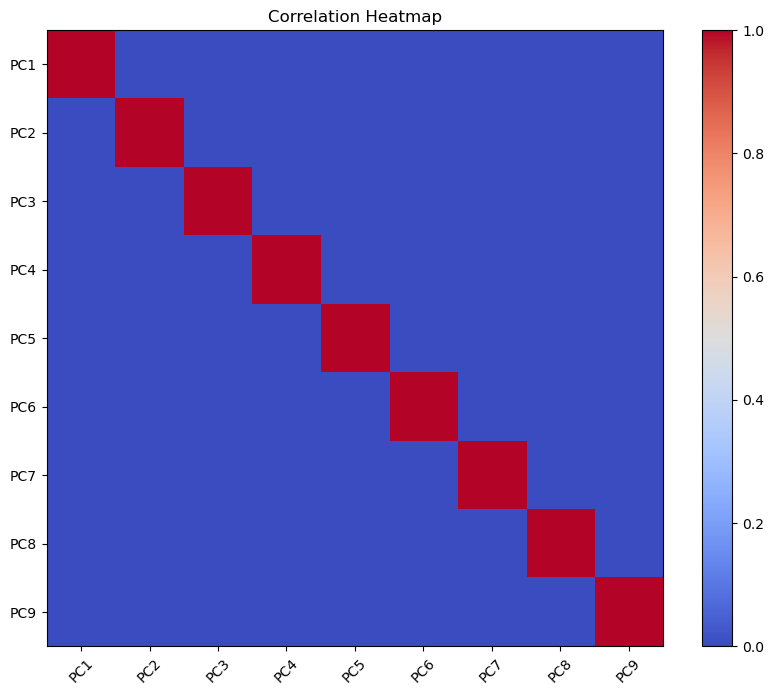

In [36]:
# pairplot of the components
sns.pairplot(reduced_df)

# correlation matrix of the compnents
plt.figure(figsize=(10, 8))
correlation = reduced_df.corr(numeric_only=True)
print(correlation)

plt.imshow(correlation, cmap='coolwarm')
plt.colorbar()
plt.xticks(range(len(correlation)), correlation.columns, rotation=45)
plt.yticks(range(len(correlation)), correlation.columns)
plt.title("Correlation Heatmap")
plt.show()

Verified:  very low coorelation between the components after PCA

# Prepare Data for Classification

In [47]:
# df[df['quality'] >8] # Count of high quality wines (>8)

# Define bins and labels
bins = [0, 7, 10]  # Bin edges
labels = ['Low', 'High']  # Corresponding labels

# Use pd.cut to categorize
df['quality-cat'] = pd.cut(df['quality'], bins=bins, labels=labels, right=False)

df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,quality-cat
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.00100,3.00,0.45,8.8,6,Low
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.99400,3.30,0.49,9.5,6,Low
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.99510,3.26,0.44,10.1,6,Low
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,Low
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.99560,3.19,0.40,9.9,6,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4893,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,Low
4894,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,Low
4895,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,Low
4896,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,High


# Preprocessing the data

In [48]:
# Set variable names to work with pipeline from practical exercise 4
X = reduced_df
y = df['quality-cat']

# Preprocessing pipeline from practical exercise4
numerical_features = X.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_features = X.select_dtypes(include=['object']).columns.tolist()


numerical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer([
    ('num', numerical_pipeline, numerical_features),
    ('cat', categorical_pipeline, categorical_features)
])

X_processed = preprocessor.fit_transform(X)
label_encoder = LabelEncoder()
y =  label_encoder.fit_transform(y)

# Split the data (80% training, 20% testing)
# We're setting stratify to yes so that both the training and test sets have similar proportions of classes in the target variable
X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, stratify=y, random_state=42)

In [49]:
# Preview the split data
print("X_train:\n", X_train)
print("X_test:\n", X_test)
print("y_train:\n", y_train)
print("y_test:\n", y_test)

X_train:
 [[ 1.55188148 -0.75273068  0.95397317 ...  0.40579745 -1.59739968
   0.18222378]
 [-0.49544586 -0.84426779  0.08460222 ... -1.32862188  0.40860513
  -0.41734964]
 [-0.71830302  0.57541528  0.31233342 ... -0.11778089  0.57211787
  -0.31303348]
 ...
 [ 1.06083691  0.19511421  0.54073627 ... -0.34310681 -1.64339049
   0.03624799]
 [ 0.80632084  0.11326548  0.13249085 ... -0.13940915 -0.21139441
  -0.51335531]
 [-0.15372602 -0.50797778 -0.2887928  ...  0.8043834   1.66441292
   1.07815888]]
X_test:
 [[-1.48732     1.72779406  1.14598847 ... -0.33281416  0.01497941
  -1.31677248]
 [ 1.30796066  0.53431932 -0.2119364  ...  1.00455458 -1.12715914
  -0.27935857]
 [ 0.45011405 -1.22572214  1.40627044 ...  1.61355183 -0.01315022
   1.19594155]
 ...
 [ 0.44909697 -1.31933498  0.3354123  ...  0.15075998 -0.1994435
   0.5798187 ]
 [ 0.17730527 -1.57860887 -1.16037265 ...  0.17131464  1.97077832
  -0.61523894]
 [-1.02539364 -0.00824191 -1.7506311  ... -1.00914475 -0.69589205
   0.36634158]

# Define Classification Models

In [50]:
models = {
    "Logistic Regression": LogisticRegression(),
    "SVM": SVC(probability=True),
    "Decision Tree": DecisionTreeClassifier(),
    "Naive Bayes": GaussianNB()
}

# Compare Results


Logistic Regression:
              precision    recall  f1-score   support

           0       0.55      0.24      0.34       210
           1       0.82      0.94      0.88       759

    accuracy                           0.79       969
   macro avg       0.68      0.59      0.61       969
weighted avg       0.76      0.79      0.76       969

AUC-ROC: 0.7893

SVM:
              precision    recall  f1-score   support

           0       0.69      0.30      0.41       210
           1       0.83      0.96      0.89       759

    accuracy                           0.82       969
   macro avg       0.76      0.63      0.65       969
weighted avg       0.80      0.82      0.79       969

AUC-ROC: 0.8320

Decision Tree:
              precision    recall  f1-score   support

           0       0.59      0.62      0.60       210
           1       0.89      0.88      0.89       759

    accuracy                           0.82       969
   macro avg       0.74      0.75      0.74       96

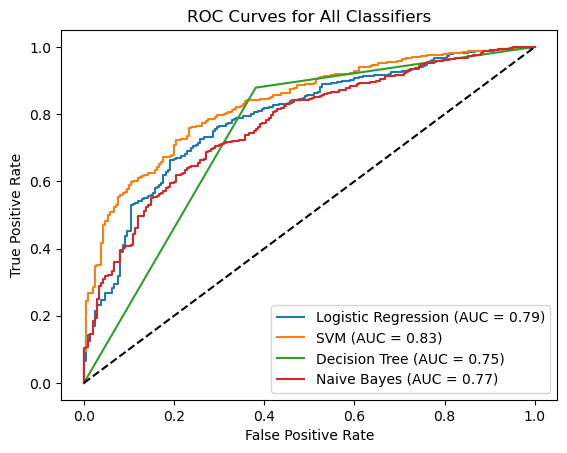

In [51]:
results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_proba = model.predict_proba(X_test)[:, 1] if hasattr(model, 'predict_proba') else None
    report = classification_report(y_test, y_pred, output_dict=True)
    auc = roc_auc_score(y_test, y_proba) if y_proba is not None else None
    results[name] = {
        "classification_report": report,
        "roc_auc": auc
    }

    # Visualization of ROC Curve
    if y_proba is not None:
        fpr, tpr, _ = roc_curve(y_test, y_proba)
        plt.plot(fpr, tpr, label=f"{name} (AUC = {auc:.2f})")

# Display Results
for name, result in results.items():
    print(f"\n{name}:")
    print(classification_report(y_test, models[name].predict(X_test)))
    if result["roc_auc"] is not None:
        print(f"AUC-ROC: {result['roc_auc']:.4f}")

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for All Classifiers")
plt.legend()
plt.show()

# Ensemble Methods

In [52]:
# Random Forrest Classifier
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)
y_proba_rf = rf.predict_proba(X_test)[:, 1]
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print(f"AUC-ROC: {roc_auc_score(y_test, y_proba_rf):.4f}")

# XGBoost Classifier
xgb_clf = xgb.XGBClassifier(eval_metric='mlogloss', use_label_encoder=False)
xgb_clf.fit(X_train, y_train)
y_pred_xbg= xgb_clf.predict(X_test)
y_proba_xbg = xgb_clf.predict_proba(X_test)[:, 1]
print("\nXGB Classifier Report:")
print(classification_report(y_test, y_pred_xbg))
print(f"AUC-ROC: {roc_auc_score(y_test, y_proba_xbg):.4f}")

# Voting Classifier
voting_clf = VotingClassifier(
    estimators=[('lr', LogisticRegression()), ('rf', RandomForestClassifier()), ('svc', SVC(probability=True))],
    voting='soft'
)
voting_clf.fit(X_train, y_train)
y_pred_voting = voting_clf.predict(X_test)
y_proba_voting = voting_clf.predict_proba(X_test)[:, 1]
print("\nVoting Classifier Report:")
print(classification_report(y_test, y_pred_voting))
print(f"AUC-ROC: {roc_auc_score(y_test, y_proba_voting):.4f}")





Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.80      0.52      0.63       210
           1       0.88      0.96      0.92       759

    accuracy                           0.87       969
   macro avg       0.84      0.74      0.77       969
weighted avg       0.86      0.87      0.86       969

AUC-ROC: 0.9014

XGB Classifier Report:
              precision    recall  f1-score   support

           0       0.73      0.52      0.61       210
           1       0.88      0.95      0.91       759

    accuracy                           0.85       969
   macro avg       0.80      0.73      0.76       969
weighted avg       0.85      0.85      0.84       969

AUC-ROC: 0.8672


c:\Users\andre\anaconda3\envs\plus-nlp-cv-ir\lib\site-packages\xgboost\core.py:158: UserWarning: [16:37:59] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Voting Classifier Report:
              precision    recall  f1-score   support

           0       0.71      0.35      0.47       210
           1       0.84      0.96      0.90       759

    accuracy                           0.83       969
   macro avg       0.78      0.66      0.68       969
weighted avg       0.81      0.83      0.81       969

AUC-ROC: 0.8871


# Hyperparameter tuning for Logistic Regression

In [58]:
# Step 4: Hyperparameter Tuning (example for Logistic Regression)
param_grid = {"C": [0.01, 0.1, 1, 10, 100]}
logistic = LogisticRegression()
grid_search = GridSearchCV(logistic, param_grid, cv=5, scoring='roc_auc')
grid_search.fit(X_train, y_train)
print("\nBest Parameters for Logistic Regression:")
print(grid_search.best_params_)


y_pred = grid_search.predict(X_test)
y_proba = grid_search.predict_proba(X_test)[:, 1]
print("\nClassification Report:")
print(classification_report(y_test, y_pred))
print(f"AUC-ROC: {roc_auc_score(y_test, y_proba):.4f}")


Best Parameters for Logistic Regression:
{'C': 100}

Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.24      0.34       210
           1       0.82      0.94      0.88       759

    accuracy                           0.79       969
   macro avg       0.68      0.59      0.61       969
weighted avg       0.76      0.79      0.76       969

AUC-ROC: 0.7894


# ROC Curve for Ensemble Methods

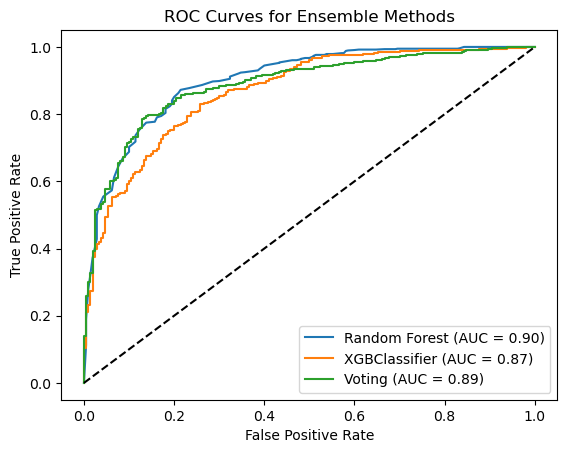

In [57]:
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_proba_rf)
plt.plot(fpr_rf, tpr_rf, label="Random Forest (AUC = {:.2f})".format(roc_auc_score(y_test, y_proba_rf)))

#fpr_ada, tpr_ada, _ = roc_curve(y_test, y_proba_ada)
#plt.plot(fpr_ada, tpr_ada, label="AdaBoost (AUC = {:.2f})".format(roc_auc_score(y_test, y_proba_ada)))

fpr_xgb, tpr_xgb, _ = roc_curve(y_test, y_proba_xbg)
plt.plot(fpr_xgb, tpr_xgb, label="XGBClassifier (AUC = {:.2f})".format(roc_auc_score(y_test, y_proba_xbg)))

fpr_voting, tpr_voting, _ = roc_curve(y_test, y_proba_voting)
plt.plot(fpr_voting, tpr_voting, label="Voting (AUC = {:.2f})".format(roc_auc_score(y_test, y_proba_voting)))

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curves for Ensemble Methods")
plt.legend()
plt.show()